<a href="https://colab.research.google.com/github/zrruziev/Deep_Learning_Practice/blob/main/TDC/C3_W2_Lab1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!rm -rf logs/ model.png 

##Download the Dataset

In [2]:
import tensorflow_datasets as tfds

# Load the IMDB Reviews dataset
imdb, info = tfds.load("imdb_reviews",  with_info=True, as_supervised=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/imdb_reviews/plain_text/1.0.0.incompleteQY83JK/imdb_reviews-train.tfrecord


  0%|          | 0/25000 [00:00<?, ? examples/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/imdb_reviews/plain_text/1.0.0.incompleteQY83JK/imdb_reviews-test.tfrecord


  0%|          | 0/25000 [00:00<?, ? examples/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/imdb_reviews/plain_text/1.0.0.incompleteQY83JK/imdb_reviews-unsupervised.tfrecord


  0%|          | 0/50000 [00:00<?, ? examples/s]

Dataset imdb_reviews downloaded and prepared to /root/tensorflow_datasets/imdb_reviews/plain_text/1.0.0. Subsequent calls will reuse this data.


In [3]:
# Print information about the dataset
print(info)

tfds.core.DatasetInfo(
    name='imdb_reviews',
    version=1.0.0,
    description='Large Movie Review Dataset.
This is a dataset for binary sentiment classification containing substantially more data than previous benchmark datasets. We provide a set of 25,000 highly polar movie reviews for training, and 25,000 for testing. There is additional unlabeled data for use as well.',
    homepage='http://ai.stanford.edu/~amaas/data/sentiment/',
    features=FeaturesDict({
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
        'text': Text(shape=(), dtype=tf.string),
    }),
    total_num_examples=100000,
    splits={
        'test': 25000,
        'train': 25000,
        'unsupervised': 50000,
    },
    supervised_keys=('text', 'label'),
    citation="""@InProceedings{maas-EtAl:2011:ACL-HLT2011,
      author    = {Maas, Andrew L.  and  Daly, Raymond E.  and  Pham, Peter T.  and  Huang, Dan  and  Ng, Andrew Y.  and  Potts, Christopher},
      title     = {Learning Word

In [4]:
# Print the contents of the dataset you downloaded
from pprint import pprint
pprint(imdb)

{'test': <PrefetchDataset element_spec=(TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>,
 'train': <PrefetchDataset element_spec=(TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>,
 'unsupervised': <PrefetchDataset element_spec=(TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>}


In [5]:
# Take 5 training examples and print its contents
for example in imdb['train'].take(5):
    pprint(example)

(<tf.Tensor: shape=(), dtype=string, numpy=b"This was an absolutely terrible movie. Don't be lured in by Christopher Walken or Michael Ironside. Both are great actors, but this must simply be their worst role in history. Even their great acting could not redeem this movie's ridiculous storyline. This movie is an early nineties US propaganda piece. The most pathetic scenes were those when the Columbian rebels were making their cases for revolutions. Maria Conchita Alonso appeared phony, and her pseudo-love affair with Walken was nothing but a pathetic emotional plug in a movie that was devoid of any real meaning. I am disappointed that there are movies like this, ruining actor's like Christopher Walken's good name. I could barely sit through it.">,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: shape=(), dtype=string, numpy=b'I have been known to fall asleep during films, but this is usually due to a combination of things including, really tired, being warm and comfortable o

In [6]:
# Make seperate lists for sentences and labels
import numpy as np

# Get the train and test sets
train_data, test_data = imdb['train'], imdb['test']

# Initialize sentences and labels lists
train_sentences = []
train_labels = []

test_sentences = []
test_labels = []

# Loop over all training examples and save the sentences and labels
# s,l --- sentence, label
for s, l in train_data:  
    train_sentences.append(s.numpy().decode('utf8'))
    train_labels.append(l.numpy())

# Loop over all test examples and save the sentences and labels
for s, l in test_data:
    test_sentences.append(s.numpy().decode('utf8'))
    test_labels.append(l.numpy())

# Convert labels lists to numpy array
train_labels_final = np.array(train_labels)
test_labels_final = np.array(test_labels)

print(type(train_labels_final), train_labels_final.dtype, train_labels_final.shape)
print(type(test_labels_final),test_labels_final.dtype, test_labels_final.shape)


<class 'numpy.ndarray'> int64 (25000,)
<class 'numpy.ndarray'> int64 (25000,)


##Remove Stopwords(I added this part)

In [22]:
stopwords = [ "a", "about", "above", "after", "again", "against", "all", "am", "an", "and", "any", "are", "as", "at", "be", "because", "been", "before", "being", "below", "between", "both", "but", "by", "could", "did", "do", "does", "doing", "down", "during", "each", "few", "for", "from", "further", "had", "has", "have", "having", "he", "he'd", "he'll", "he's", "her", "here", "here's", "hers", "herself", "him", "himself", "his", "how", "how's", "i", "i'd", "i'll", "i'm", "i've", "if", "in", "into", "is", "it", "it's", "its", "itself", "let's", "me", "more", "most", "my", "myself", "nor", "of", "on", "once", "only", "or", "other", "ought", "our", "ours", "ourselves", "out", "over", "own", "same", "she", "she'd", "she'll", "she's", "should", "so", "some", "such", "than", "that", "that's", "the", "their", "theirs", "them", "themselves", "then", "there", "there's", "these", "they", "they'd", "they'll", "they're", "they've", "this", "those", "through", "to", "too", "under", "until", "up", "very", "was", "we", "we'd", "we'll", "we're", "we've", "were", "what", "what's", "when", "when's", "where", "where's", "which", "while", "who", "who's", "whom", "why", "why's", "with", "would", "you", "you'd", "you'll", "you're", "you've", "your", "yours", "yourself", "yourselves" ]

new_train_sentences = []
new_test_sentences = []

for sentence in train_sentences:
    sentence = sentence.split()
    sentence = [ word for word in sentence if word not in stopwords]
    new_sentence = " ".join(sentence)
    new_train_sentences.append(new_sentence)

for sentence in test_sentences:
    sentence = sentence.split()
    sentence = [ word for word in sentence if word not in stopwords]
    new_sentence = " ".join(sentence)
    new_test_sentences.append(new_sentence)

# Print to see the difference between train_sentences and new_train_sentences
pprint(train_sentences[0])
pprint(new_train_sentences[0])

("This was an absolutely terrible movie. Don't be lured in by Christopher "
 'Walken or Michael Ironside. Both are great actors, but this must simply be '
 'their worst role in history. Even their great acting could not redeem this '
 "movie's ridiculous storyline. This movie is an early nineties US propaganda "
 'piece. The most pathetic scenes were those when the Columbian rebels were '
 'making their cases for revolutions. Maria Conchita Alonso appeared phony, '
 'and her pseudo-love affair with Walken was nothing but a pathetic emotional '
 'plug in a movie that was devoid of any real meaning. I am disappointed that '
 "there are movies like this, ruining actor's like Christopher Walken's good "
 'name. I could barely sit through it.')
("This absolutely terrible movie. Don't lured Christopher Walken Michael "
 'Ironside. Both great actors, must simply worst role history. Even great '
 "acting not redeem movie's ridiculous storyline. This movie early nineties US "
 'propaganda piece

##Generate Padded Sequences

In [23]:
vocab_size = 10000
max_len = 120
embedding_dim = 32
trunc_type = 'post'
oov_tok = "<OOV>"

In [24]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Initialize the Tokenizer class
tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_tok)

# Generate the word index dictionary for the training sentences
tokenizer.fit_on_texts(new_train_sentences)  # after removing stopwords use new_train_sentences
word_index = tokenizer.word_index

# Generate and pad the training sequences
sequences = tokenizer.texts_to_sequences(new_train_sentences)  # after removing stopwords use new_train_sentences
train_padded = pad_sequences(sequences, maxlen=max_len, truncating=trunc_type)

# Generate and pad the test sequences
test_sequences = tokenizer.texts_to_sequences(new_test_sentences)  # after removing stopwords use new_test_sentences
test_padded = pad_sequences(test_sequences, maxlen=max_len, )


print(type(train_padded),train_padded.dtype, train_padded.shape)
print(type(test_padded),test_padded.dtype, test_padded.shape)

print(f'\n{word_index}')

<class 'numpy.ndarray'> int32 (25000, 120)
<class 'numpy.ndarray'> int32 (25000, 120)

{'<OOV>': 1, 'br': 2, 'i': 3, 'the': 4, 'movie': 5, 'film': 6, 'not': 7, 'one': 8, 'it': 9, 'like': 10, 'this': 11, 'just': 12, 'good': 13, 'no': 14, 'time': 15, 'even': 16, 'story': 17, 'really': 18, 'see': 19, 'and': 20, 'can': 21, 'well': 22, 'much': 23, 'get': 24, 'bad': 25, 'will': 26, 'also': 27, 'people': 28, 'first': 29, 'great': 30, 'but': 31, "don't": 32, 'in': 33, 'made': 34, 'way': 35, 'make': 36, 'a': 37, 'movies': 38, 'think': 39, 'characters': 40, 'watch': 41, 'two': 42, 'films': 43, 'character': 44, 'there': 45, 'seen': 46, 'many': 47, 'life': 48, 'plot': 49, 'never': 50, 'acting': 51, "it's": 52, 'little': 53, 'best': 54, 'love': 55, 'show': 56, 'know': 57, 'off': 58, 'ever': 59, 'all': 60, 'if': 61, 'better': 62, 'end': 63, 'still': 64, 'man': 65, 'say': 66, 'scene': 67, 'he': 68, 'that': 69, 'scenes': 70, 'go': 71, 'something': 72, 'back': 73, 'you': 74, 'real': 75, 'watching': 76,

#Build and Compile the Model


In [25]:
# # vocab_size = 10000
# # max_len = 120
# # embedding_dim = 8


import tensorflow as tf

# Build the Model
model = tf.keras.Sequential([
                             
        tf.keras.layers.Input(shape=(max_len,)),
        tf.keras.layers.Embedding(vocab_size, embedding_dim),

        # tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_len),

        # tf.keras.layers.Flatten(),
        tf.keras.layers.GlobalAveragePooling1D(),

        tf.keras.layers.Dense(6, activation='relu'),
        tf.keras.layers.Dense(1, activation='sigmoid')
        ])

model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 120, 32)           320000    
                                                                 
 global_average_pooling1d (G  (None, 32)               0         
 lobalAveragePooling1D)                                          
                                                                 
 dense_2 (Dense)             (None, 6)                 198       
                                                                 
 dense_3 (Dense)             (None, 1)                 7         
                                                                 
Total params: 320,205
Trainable params: 320,205
Non-trainable params: 0
_________________________________________________________________


##Plot the model to understand well!

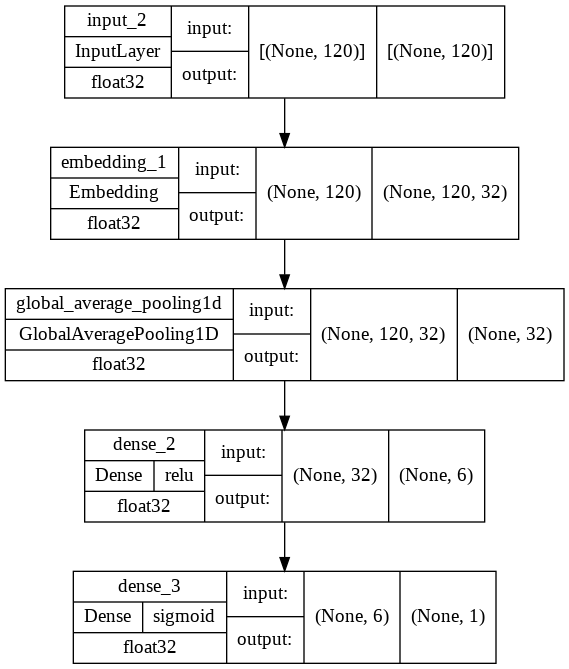

In [26]:
tf.keras.utils.plot_model(model,
                          to_file='model.png',
                          show_shapes=True,
                          show_dtype=True,
                          show_layer_names=True,
                          dpi=96,
                          show_layer_activations=True)

#Train the Model

In [28]:
# By default batch_size=32
model.fit(train_padded,
          train_labels_final,
          epochs=10,
        #   batch_size=2500,
          validation_data=(test_padded, test_labels_final))

Epoch 1/10
782/782 [==============================] - 10s 12ms/step - loss: 0.3972 - accuracy: 0.8614 - val_loss: 0.3149 - val_accuracy: 0.8714
Epoch 2/10
782/782 [==============================] - 9s 11ms/step - loss: 0.2502 - accuracy: 0.9069 - val_loss: 0.3005 - val_accuracy: 0.8754
Epoch 3/10
782/782 [==============================] - 8s 11ms/step - loss: 0.2048 - accuracy: 0.9259 - val_loss: 0.3150 - val_accuracy: 0.8718
Epoch 4/10
782/782 [==============================] - 8s 11ms/step - loss: 0.1750 - accuracy: 0.9374 - val_loss: 0.3352 - val_accuracy: 0.8679
Epoch 5/10
782/782 [==============================] - 8s 11ms/step - loss: 0.1526 - accuracy: 0.9463 - val_loss: 0.3662 - val_accuracy: 0.8618
Epoch 6/10
782/782 [==============================] - 7s 9ms/step - loss: 0.1324 - accuracy: 0.9567 - val_loss: 0.3982 - val_accuracy: 0.8572
Epoch 7/10
782/782 [==============================] - 7s 9ms/step - loss: 0.1161 - accuracy: 0.9634 - val_loss: 0.4501 - val_accuracy: 0.8522


#Prepare Tensorboard's Projector for Embeddings

In [29]:
!rm -rf logs/

In [30]:
from tensorboard.plugins import projector
import os

# create logging directory
log_dir='logs'
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

# index_word = tokenizer.index_word
# write wordindex dictionary
with open(os.path.join(log_dir, 'metadata.tsv'), "w") as f:
  for w in word_index:
    f.write("{}\n".format(w))
    # f.write(f'{w}\n')

# weights from the embedding layer, in our case: model.layers[1]
weights = tf.Variable(model.layers[0].get_weights()[0])
checkpoint = tf.train.Checkpoint(embedding=weights)
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))

# configuration set-up
config = projector.ProjectorConfig()
embedding = config.embeddings.add()
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
projector.visualize_embeddings(log_dir, config)

In [31]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

#If you do not want to use tensorboard in colab then continue...
##Make 'meta.tsv' and 'vecs.tsv' files and download them to visualize in [Projector](https://projector.tensorflow.org/)


In [32]:
# Get the embedding layer from the model (i.e. first layer)
embedding_layer = model.layers[0]

# Get the weights of the embedding layer
embedding_weights = embedding_layer.get_weights()[0]

# Print the shape. Expected is (vocab_size, embedding_dim)
print(embedding_weights.shape)

(10000, 32)


In [33]:
# Get the index-word dictionary
reverse_word_index = tokenizer.index_word
print(reverse_word_index)

{1: '<OOV>', 2: 'br', 3: 'i', 4: 'the', 5: 'movie', 6: 'film', 7: 'not', 8: 'one', 9: 'it', 10: 'like', 11: 'this', 12: 'just', 13: 'good', 14: 'no', 15: 'time', 16: 'even', 17: 'story', 18: 'really', 19: 'see', 20: 'and', 21: 'can', 22: 'well', 23: 'much', 24: 'get', 25: 'bad', 26: 'will', 27: 'also', 28: 'people', 29: 'first', 30: 'great', 31: 'but', 32: "don't", 33: 'in', 34: 'made', 35: 'way', 36: 'make', 37: 'a', 38: 'movies', 39: 'think', 40: 'characters', 41: 'watch', 42: 'two', 43: 'films', 44: 'character', 45: 'there', 46: 'seen', 47: 'many', 48: 'life', 49: 'plot', 50: 'never', 51: 'acting', 52: "it's", 53: 'little', 54: 'best', 55: 'love', 56: 'show', 57: 'know', 58: 'off', 59: 'ever', 60: 'all', 61: 'if', 62: 'better', 63: 'end', 64: 'still', 65: 'man', 66: 'say', 67: 'scene', 68: 'he', 69: 'that', 70: 'scenes', 71: 'go', 72: 'something', 73: 'back', 74: 'you', 75: 'real', 76: 'watching', 77: 'now', 78: 'though', 79: "i'm", 80: "doesn't", 81: 'years', 82: 'thing', 83: 'old'

In [34]:
import io

# Open writeable files
out_v = io.open('vecs.tsv', 'w', encoding='utf-8')
out_m = io.open('meta.tsv', 'w', encoding='utf-8')

# Initialize the loop. Start counting at `1` because `0` is just for the padding
for word_num in range(1, vocab_size):

    # Get the word associated at the current index
    word_name = reverse_word_index[word_num]

    # Get the embedding weights associated with the current index
    word_embedding = embedding_weights[word_num]

    # Write the word name
    out_m.write(word_name + "\n")

    # Write the word embedding
    out_v.write('\t'.join([str(x) for x in word_embedding]) + "\n")

# Close the files
out_v.close()
out_m.close()


In [35]:
# Import files utilities in Colab
try:
  from google.colab import files
except ImportError:
  pass

# Download the files
else:
  files.download('vecs.tsv')
  files.download('meta.tsv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>